<a href="https://colab.research.google.com/github/johanhoffman/DD2363-VT20/blob/JonasNylund/Lab-6/jonasnylund_lab6.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Lab 6: ODEs**
**Jonas Nylund**

# **Abstract**

In this lab, we implement the theta method for time stepping differential equations, and test the method to verify its accuracy for both scalar and systems of equations.
We also implement a simulation of orbital mechanics together with a performance improving implementation of a quadtree.

#**About the code**

A short statement on who is the author of the file, and if the code is distributed under a certain license. 

In [0]:
"""This program is a template for lab reports in the course"""
"""DD2363 Methods in Scientific Computing, """
"""KTH Royal Institute of Technology, Stockholm, Sweden."""

# Copyright (C) 2019 Jonas Nylund (jonasnyl@kth.se)
# Methods, principles and equations for verifying accuracy and stability
# of systems of ODEs was discussed with Helmer Nylén. 

# This file is part of the course DD2363 Methods in Scientific Computing
# KTH Royal Institute of Technology, Stockholm, Sweden
#
# This is free software: you can redistribute it and/or modify
# it under the terms of the GNU Lesser General Public License as published by
# the Free Software Foundation, either version 3 of the License, or
# (at your option) any later version.

'KTH Royal Institute of Technology, Stockholm, Sweden.'

# **Set up environment**

To have access to the neccessary modules you have to run this cell. If you need additional modules, this is where you add them. 

In [0]:
# Load neccessary modules.
from google.colab import files

import time
import numpy as np
from scipy.optimize import newton;

from typing import Tuple, Dict, Sequence

from matplotlib import pyplot as plt;
import matplotlib.animation as animation
from matplotlib.patches import Rectangle
from IPython.display import HTML
from matplotlib import animation, rc

# **Introduction**

Give a short description of the problem investigated in the report, and provide some background information so that the reader can understand the context. 

Briefly describe what method you have chosen to solve the problem, and justify why you selected that method. 

Here you can express mathematics through Latex syntax, and use hyperlinks for references.

[Hyperlink to DD2363 course website.](https://kth.instructure.com/courses/7500)

$
{\displaystyle \frac{\partial u}{\partial t}} + u\cdot \nabla u +\nabla p = f, \quad \nabla \cdot u=0$



# **Methods**

Describe the methods you used to solve the problem. This may be a combination of text, mathematical formulas (Latex), algorithms (code), data and output.  

**Time stepping for scalar IVP**

Implementing the theta method, which for different values of theta reduces to Euler backwards and forwards methods, aswell as the trapezoidal method.


In [0]:
def timeStep(u_prime, u0, dt, theta):

  f = lambda u: u-u0 - dt*((1-theta)*u_prime(u) + theta*u_prime(u0));
  return newton(f, u0);
#this is all the implementation code we needed, the rest is just for testing...

In [0]:
def randODE():
  a = -np.random.rand();
  u0 = 10;
  u = lambda t: u0*np.exp(a*t);
  u_prime = lambda u: a*u;

  return u, u_prime;

def integrateODE(u, u_prime, dt, theta, time=10, noise=0, u0=10):
  T = [];
  U = [];
  U_approx = [];

  u_approx = u0;
  t = 0;
  for i in range(int(time/dt)):
    T.append(t);
    U.append(u(t));
    U_approx.append(u_approx)
    u_approx = timeStep(u_prime, u_approx, dt, theta) + noise*(np.random.rand()-1/2);
    t += dt;
  return T,U,U_approx;

The solution of an ODE of the kind $\dot u(t)=\lambda u(t)$ is the exponential function $u(t) = u_0 e^{\lambda t}$. Comparing the solution from the three different solution:

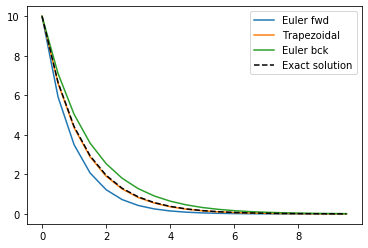

In [0]:
u,up = randODE();
plt.figure();

for theta, label in zip([1,0.5,0], ["Euler fwd","Trapezoidal","Euler bck"]):
  T,U,U_approx = integrateODE(u,up, 0.5, theta);

  plt.plot(T, U_approx, label=label);
plt.plot(T, U, 'k--', label="Exact solution");
plt.legend();
plt.show();

# **Results**

**Accuracy of different methods**

Reducing the timestep, the error decreases linearly. For this kind of problem, the trapezoidal method gives impressively good reults.


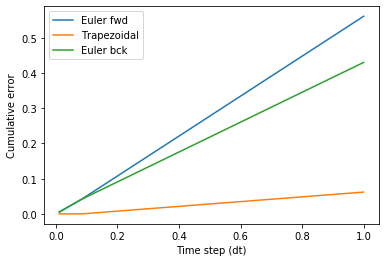

In [0]:
E = [];
dt = [];
u,up = randODE();

for i in range(1,100,10):
  e = [];
  for theta in [1,0.5,0]:
    T,U,U_approx = integrateODE(u,up, 1/i, theta);

    U = np.array(U);
    U_approx = np.array(U_approx);
    error = sum(abs(U-U_approx))/len(U);
    e.append(error);

  E.append(e);
  dt.append(1/i);


plt.figure();
a = plt.plot(dt, E);
plt.xlabel("Time step (dt)");
plt.ylabel("Cumulative error");
plt.legend(a, ["Euler fwd", "Trapezoidal", "Euler bck"]);
plt.show();

**Stability**

The ODE has one stable point at $x=0$. 

All the variants of the time stepping methods converge to the equilibrium point when disturbed, which is expected as the limit $\lim_{t\to\infty} e^{\lambda t} = 0$ for $\lambda < 0$.

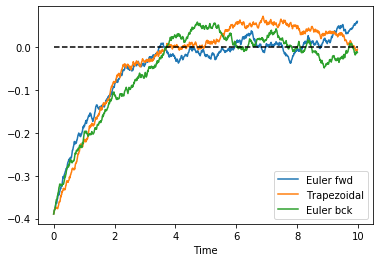

In [0]:
E = [];
dt = [];
u,up = randODE();
u,up = randODE();
u0 = np.random.rand()-1/2
for theta, label in zip([1,0.5,0], ["Euler fwd", "Trapezoidal", "Euler bck"]):
  T,U,U_approx = integrateODE(u,up, 1/i, theta, u0=u0, noise=1/100);

  U = np.array(U);
  U_approx = np.array(U_approx);
  plt.plot(T,U_approx, label=label);



plt.plot([0,10],[0,0],'k--');
plt.xlabel("Time");
plt.legend();
plt.show();

**Time stepping for system of IVP**

A system can be solved by the same time stepping method as a scalar function.

Here the Predator-Prey equations are solved



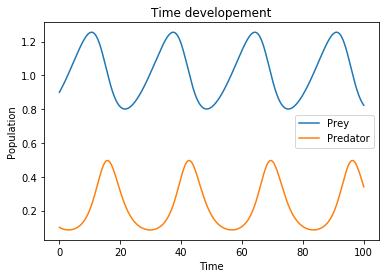

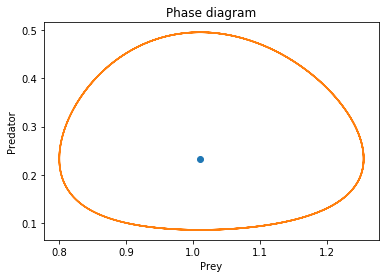

In [0]:
alpha = 0.063; 
beta = 0.27;
gamma = 0.93;
delta = 0.92;

u = lambda x: x; 
u_prime = lambda u: np.array([u[0]*(alpha-beta*u[1]), u[1]*(delta*u[0]-gamma)]);

u0 = np.array([0.9, 0.1]);

T,U,U = integrateODE(u, u_prime, 0.01, 0.5, time=100, noise=0, u0=u0);

T = np.array(T);
U = np.array(U);

plt.figure();
plt.title("Time developement");
plt.plot(T, U[:,0], label="Prey");
plt.plot(T, U[:,1], label="Predator");
plt.xlabel("Time");
plt.ylabel("Population")
plt.legend();
plt.show();

plt.figure();
plt.title("Phase diagram");
plt.plot([gamma/delta], [alpha/beta], 'o');
plt.plot(U[:,0], U[:,1]);
plt.xlabel("Prey");
plt.ylabel("Predator");
plt.show();


**Accuracy**
The accuracy of the model can be verified by comparing to a system with a known solution. Since systems of differential equations are annoying to solve, we just test with $\sin, \cos$ (credit Helmer Nylén).

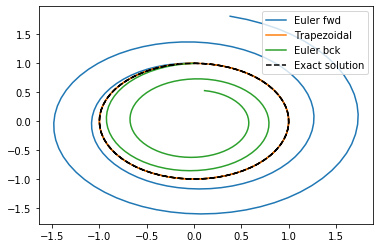

In [0]:
u = lambda t: np.array([np.sin(t), np.cos(t)]);
up = lambda u: np.array([-u[1], u[0]]);

t = 0;
dt = 0.1;
u0 = u(t);

plt.figure();
for theta, label in zip([1,0.5,0], ["Euler fwd", "Trapezoidal", "Euler bck"]):
  T, U, Up = integrateODE(u, up, dt, theta, time=2*np.pi*2, u0=u0);

  
  Up = np.array(Up);
  plt.plot(Up[:,0], Up[:,1], label=label);

U = np.array(U);
plt.plot(U[:,0], U[:,1], 'k--', label="Exact solution");
plt.legend();
plt.show();


The error decreases linearly with timestep length, just as in the scalar case. The trapezoidal method is energy conserving, and for stable for these kinds of orbits. 

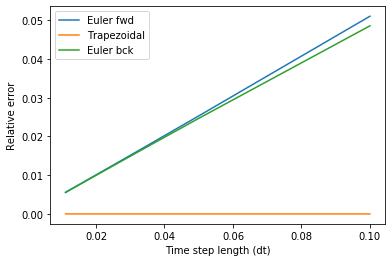

In [0]:
u = lambda t: np.array([np.sin(t), np.cos(t)]);
up = lambda u: np.array([-u[1], u[0]]);


for theta, label in zip([1,0.5,0], ["Euler fwd", "Trapezoidal", "Euler bck"]):
  t = 0;
  u0 = u(t);
  dt = [];
  E = [];
  for i in range(10, 100, 10):
    dt.append(1/i);
    T, U, Up = integrateODE(u, up, 1/i, theta, time=2*np.pi*2, u0=u0);

    U = np.array(U);
    Up = np.array(Up);
    e = 0;
    for j in range(len(U)):
      e += np.sqrt(Up[i,0]**2 + Up[i,1]**2)-1;
    E.append(abs(e)/len(U));

  plt.plot(dt, E, label=label);
plt.xlabel("Time step length (dt)");
plt.ylabel("Relative error");
plt.legend();
plt.show();

**Stabiliy of system**

The stability of the predator-prey system can be tested by disturbing the system from its equilibrium point. The problem should be conserving in its phase orbit. Euler forward can be seen to diverge from the equilibrium, Euler backward converges to the equilibrium and the trapezoidal method stays in the same orbit when disturbed.

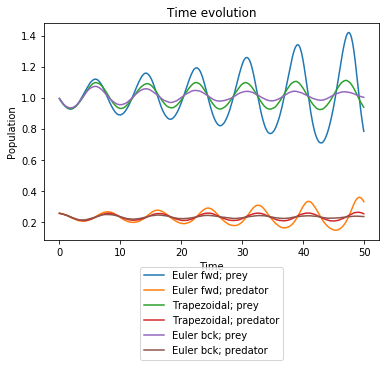

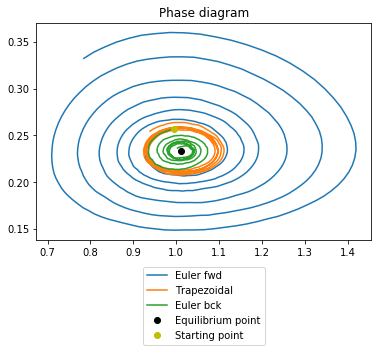

In [0]:
alpha = 0.63; 
beta = 2.7;
gamma = 0.93;
delta = 0.92;

u = lambda x: x; 
u_prime = lambda u: np.array([u[0]*(alpha-beta*u[1]), u[1]*(delta*u[0]-gamma)]);

u0 = np.array([gamma/delta, alpha/beta]) + (np.random.rand(2)-1/2)/10;

B = [];

for theta, label in zip([1,0.5,0], ["Euler fwd", "Trapezoidal", "Euler bck"]):
  T,U,U_approx = integrateODE(u,u_prime, 1/10, theta, u0=u0, noise=1/1000, time=50);

  U = np.array(U);
  U_approx = np.array(U_approx);
  B.append(U_approx);

  for data, lbl in zip(U_approx.transpose(), [label+"; prey", label+"; predator"]):
    plt.plot(T, data, label=lbl);

plt.title("Time evolution");
plt.xlabel("Time");
plt.ylabel("Population");
plt.legend(loc='upper center', bbox_to_anchor=(0.5,-0.1));
plt.show();


plt.figure();
for data, lbl in zip(B, ["Euler fwd", "Trapezoidal", "Euler bck"]):
  plt.plot(data[:,0], data[:,1], label=lbl);

plt.plot(gamma/delta, alpha/beta, "ko", label="Equilibrium point");
plt.plot(u0[0], u0[1], 'yo', label="Starting point");
plt.title("Phase diagram");
plt.legend(loc='upper center', bbox_to_anchor=(0.5,-0.1));
plt.show();


#**Simulation of orbital motion (problem 4)**
**Introduction**

The N-body problem is the problem of predicting the motion of a particle system of three or more bodies, where the particles all interact with each other through some kind of forces, and each particle influences every other. The problem cannot be solved exactly, and must be integrated numerically. In this case we focus on the problem of orbital motion, but similair algorithms could be developed for particles interacting by electromagnetic and other forces.

Since each particle influences every other, the problem grovs as $\mathcal{O}(n^2)$ in number of particles. To make simulating large particle systems efficiently, there are ways of reducing the complexity by approximating the density of particles in the domain by dividing space into larger regions and depositing the force-inducing properties to some sort of grid.
One such method is the Barnes Hut algorithm, which divides space into an octtree in 3D and analogously quadtree in 2D. For particles at large distance from others, the forces can be calculated against a node in the tree-structure that contains multiple particles, thus reducing the number of computations. For large simulations, this can reduce the complexity to $\mathcal{O}(n\log n)$, however the construction of the quadtree reduces the performance gain.

#**Method**

**Particle object**

Each particle is represented as a object. The particle positions is updated iteratively using the Verlet-Størmer method, which is energy conserving. The method updates the system in two steps; first, the position is updated according to the current velocity and accelleration for each object. Then, the accelleration and velocity is updated in the new position.  

In [0]:

class Body(object):
	## Class representing a celestial body in the simulation.

	G = 1/10;
	theta = 10 * np.pi/180;

	@staticmethod
	def createObjects(n):
		objects = [];

  	## Add a large central body, otherwise nothing is ever even remotely stable.
		objects.append(Body(n, (0,0), (0,0)));
		for i in range(n-1):
			m = np.random.rand()**2;

			r = np.random.rand()*8 + 0.25;
			alpha = np.random.rand()*2*np.pi;

			x = r*np.cos(alpha);
			y = r*np.sin(alpha);

			v = np.sqrt(Body.G*(m+n)/r)*(1+(np.random.rand()-1/2)/2);
			u = -v*np.sin(alpha)# + np.random.rand()/10;
			v = v*np.cos(alpha)# + np.random.rand()/10;

			pos = (x, y);
			vel = (u, v);

			objects.append(Body(m, pos, vel));
		return objects;

	@staticmethod
	def toVectors(objects):
		x = np.zeros(len(objects));
		y = np.zeros(len(objects));
		size = np.zeros(len(objects));

		for i in range(len(objects)):
			x[i] = objects[i].pos[0];
			y[i] = objects[i].pos[1];
			size[i] = objects[i].size();
		return x,y, size;

	@staticmethod
	def update(objects, quadTree, dt):
		for body in objects:
			body.step_pos(quadTree, dt);
		for body in objects:
			body.move();

		quadTree = Quad.buildTree(objects);
		quadTree.calcCenterOfMass();

		i = 0;
		for body in objects:
			i+=body.step_vel(quadTree, dt);

		return quadTree,i;

	@staticmethod
	def collisionDetection(objects):
		collided = [];
		newobjects = [];
		for body in objects:
			if(body in collided):
				continue;

			b = body.collisionDetect(body.quad);
			if(b is not None):
				collided.append(body);
				collided.append(b);
				newobjects.append(body.collide(b));
		
		for body in collided:
			objects.remove(body);
		for body in newobjects:
			objects.append(body);

	
	@staticmethod
	def calcEnergy(objects, quad):
		E = 0;
		for body in objects:
			E += body.mass*(body.vel[0]**2 + body.vel[1]**2)/2;
			#E -= body.mass*quad.potentialEnergy(body, Body.theta);
		return E;

	def __init__(self, mass: float, pos: Tuple[float, float], vel: Tuple[float, float]):
		self.mass = mass;
		self.pos = pos;
		self.upos = pos;
		self.vel = vel;
		self.uvel = vel;
		self.acc = (0,0);
		self.uacc = (0,0);
		self.quad = None;

	def __str__(self):
		return "Body@({},{})".format(round(self.pos[0],3), round(self.pos[1],3));

	def size(self):
		return 100*np.power(self.mass, 1/3);


	## Step the particle position dt forward in time.
	def step_pos(self, quadTree, dt: float):

		#Fx,Fy, i = quadTree.calcAcc(self, Body.theta);
		x = self.pos[0];
		y = self.pos[1];
		x += self.vel[0]*dt + self.acc[0]/2*dt**2;
		y += self.vel[1]*dt + self.acc[1]/2*dt**2;
		self.upos = (x,y);
		#self.acc = (Fx,Fy);

	## Step the particle velocity dt forward in time.
	def step_vel(self, quadTree, dt: float):

		fx, fy, i = quadTree.calcAcc(self, Body.theta);
		u = self.vel[0];
		v = self.vel[1];
		u += (self.acc[0] + fx)*dt/2;
		v += (self.acc[1] + fy)*dt/2;
		self.vel = (u,v);
		self.acc = (fx,fy);

		return i;

	def move(self):
		self.pos = self.upos;


	def collisionDetect(self, quad):
		if(quad.hasChildren):
			for child in quad.children:
				if(child.body is not None and child.body is not self):
					if(self.hasCollided(child.body)):
						return child.body;
		
		if(quad.parent is not None):
			return self.collisionDetect(quad.parent);

		return None;

	def hasCollided(self, body):
		d = np.sqrt((self.pos[0]-body.pos[0])**2 + (self.pos[1]-body.pos[1])**2);
		if(d*30 < np.power(self.mass,1/3) + np.power(body.mass,1/3)):
			return True;

		return False;

	def collide(self, body):
		m2 = self.mass + body.mass;
		vx = (self.vel[0]*self.mass+body.vel[0]*body.mass)/m2;
		vy = (self.vel[1]*self.mass+body.vel[1]*body.mass)/m2;

		x = (self.pos[0]*self.mass + body.pos[0]*body.mass)/m2;
		y = (self.pos[1]*self.mass + body.pos[1]*body.mass)/m2;

		b = Body(m2, (x,y), (vx,vy));
		return b;


**Quadtree**

Space is divided recursively into cells. This is done by first drawing a root node around the entire space that is occupied by the particles. Then each particle is added to the root node. If the node already contains a particle, it is divided into four equaly large nodes and both particles are added to the child node corresponding to its position. If that node has any particles in it, the procedure is repeated until an empty leaf node is found for each particle.

When calculating the net force on a body, the tree is traversed from the root down, until either each leaf node is reached, or the ratio of the nodes width to distance from the corresponding body is small enough. When either criteria is met, the nodes center of mass and mass sum is used to calculate the force.

In [0]:

class Quad(object):
	## A quadtree class for dividing space into smaller squares.

	def buildTree(objects: Sequence[Body]):
		epsilon = 0.01;
		X,Y,size = Body.toVectors(objects);

		x0 = np.min(X)-epsilon;
		y0 = np.min(Y)-epsilon;
		w = np.max(X)-x0+epsilon;
		h = np.max(Y)-y0+epsilon;

		quadTree = Quad(None, (x0,y0),(w,h));
		for i in range(len(objects)):
			quadTree.addBody(objects[i]);

		return quadTree

	def __init__(self, parent, node: Tuple[float, float], size: Tuple[float, float]):
		self.parent = parent;

		self.children = [None]*4;
		self.hasChildren = False;
		self.body = None;
		self.rect = None;

		self.node = node;
		self.size = size;
		self.CoM = (0,0);
		self.mass = 0;

	def potentialEnergy(self, body, theta):

		dist = np.sqrt((self.CoM[0]-body.pos[0])**2 + (self.CoM[1]-body.pos[1])**2);
		e = 0;
		if(self.body == body):
			## We have found our own quad
			return 0;

		if(not self.hasChildren) or (np.sqrt(self.size[0]**2+self.size[1]**2)/dist < theta):
			return Body.G*self.mass/dist;

		else:
			for child in self.children:
				e += child.potentialEnergy(body, theta);

		return e;


	## Calculate the accelleration on a object depending on its position in the quadtree.
	## 
	def calcAcc(self, body, theta):
		Fx = 0;
		Fy = 0;
		i = 0;
		dist_sq = (self.CoM[0]-body.pos[0])**2 + (self.CoM[1]-body.pos[1])**2+0.001;
		dist = np.sqrt(dist_sq);

		if(self.body is body):
			## We have found our own quad
			pass;

		elif not self.hasChildren and self.body is not None:
			f = Body.G*self.mass/dist_sq;
			Fx = f * (self.CoM[0]-body.pos[0])/dist;
			Fy = f * (self.CoM[1]-body.pos[1])/dist;
			i=1;

		elif not self.hasChildren and self.body is None:
			#Empty quad
			pass;

		elif np.sqrt(self.size[0]**2+self.size[1]**2)/dist < theta:
			f = Body.G*self.mass/dist_sq;
			Fx = f * (self.CoM[0]-body.pos[0])/dist;
			Fy = f * (self.CoM[1]-body.pos[1])/dist;
			i=1;
			#print(np.sqrt(self.size[0]**2+self.size[1]**2)/dist, theta);

		elif self.hasChildren:
			for child in self.children:
				fx,fy, c = child.calcAcc(body, theta);
				i += c;
				Fx += fx;
				Fy += fy;

		return Fx, Fy, i;


	## Update the center of mass for this node, reqursively from its children
	## if not a leaf node, or from its body if a leaf.
	def calcCenterOfMass(self):

		if self.hasChildren:
			m = 0;
			com_x = 0;
			com_y = 0;
			for child in self.children:
				child.calcCenterOfMass();
				m += child.mass;
				com_x += child.CoM[0]*child.mass;
				com_y += child.CoM[1]*child.mass;

			self.CoM = (com_x/m, com_y/m);
			self.mass = m;

		elif(self.body is None):
			self.CoM = (0,0);
			self.mass = 0;
		
		else:
			self.CoM = self.body.pos;
			self.mass = self.body.mass;

		#print(self, (round(self.CoM[0],3), round(self.CoM[1],3)), round(self.mass,3));


	## Add a body object to this node. Pass the body on to child nodes if
	## necessary.
	def addBody(self, body: Body):
		if(self.hasChildren):
			for child in self.children:
				if(child.isInside(body.pos)):
					child.addBody(body);
					return;

		elif(self.body is not None):
			self.createChildren();
			self.addBody(self.body);
			self.addBody(body);
			self.body = None;

		else:
			self.body = body;
			body.quad = self;


	## Create a child node in each sub-quadrant
	def createChildren(self):
		for i in range(len(self.children)):
			self.createChild(i);
		self.hasChildren = True;


	## Create a child node if not already exists.
	def createChild(self, quadrant: int):

		center = self.getCenterCoordinates();
		size = (self.size[0]/2, self.size[1]/2);

		if(quadrant == 0 and self.children[0] is None):
			## First quadrant
			self.children[0] = Quad(self, center,size);

		if(quadrant == 1 and self.children[1] is None):
			## Second quadrant 
			self.children[1] = Quad(self, (self.node[0],center[1]),size);

		if(quadrant == 2 and self.children[2] is None):
			## Third quadrant 
			self.children[2] = Quad(self, self.node,size);

		if(quadrant == 3 and self.children[3] is None):
			## Forth quadrant 
			self.children[3] = Quad(self, (center[0],self.node[1]),size);


	## Return the center (x,y) position of this node
	def getCenterCoordinates(self):
		return (self.node[0]+self.size[0]/2, self.node[1]+self.size[1]/2);


	## Check if a certain position is inside this node
	def isInside(self, pos: Tuple[float, float]) -> bool:
		if(pos[0] < self.node[0] or self.node[0]+self.size[0] < pos[0]):
			## X-coor inside bounding box?
			return False;

		if(pos[1] < self.node[1] or self.node[1]+self.size[1] < pos[1]):
			## Y-coor inside bounding box?
			return False;

		return True;


	## Draw the bounding box if this node and its children to a graph object.
	def draw(self, ax):

		if(self.hasChildren):
			for child in self.children:
				child.draw(ax);
		else:
			self.rect = Rectangle(xy=self.node ,width=self.size[0], height=self.size[1], linewidth=1, color="green", fill=False);
			ax.add_patch(self.rect);

	def clear(self):

		if(self.hasChildren):
			for child in self.children:
				child.clear();
		elif self.rect is not None:
			self.rect.remove();

	def __str__(self):
		return "Node@({},{}), ({},{})".format(round(self.node[0],2), round(self.node[1],2), round(self.size[0],2), round(self.size[1],2));



**Helper functions for running/plotting**

In [0]:
def step(objects, quadTree, iterations, dt):
	C = 0;
	for i in range(iterations):
		quadTree,c = Body.update(objects, quadTree, dt);
		C += c;

	return objects, quadTree, C//iterations;

def jupyter_animate(i):
  global sc, ax, objects, quadTree,t, dt, iterations;
  quadTree.clear();
  o, quadTree, C = step(objects, quadTree, iterations, dt);

  quadTree.draw(ax);

  X,Y,size = Body.toVectors(objects);
  sc.set_offsets(np.c_[X,Y]);
  sc.set_sizes(size);

  print("Frame:", i, "interactions:", C, "T:", round(t,2));
  t += dt*iterations;


def animate(sc, ax, objects, quadTree):
	quadTree.draw(ax);

	X,Y,size = Body.toVectors(objects);
	sc.set_offsets(np.c_[X,Y]);
	sc.set_sizes(size);

	plt.pause(0.01);
	quadTree.clear();



def run_system(n_obj, n_frames, plot=True):

	objects = Body.createObjects(n_obj);

	iterations = 10;
	t = 0;
	dt = 0.01;
	T = [];
	E = [];
	I = [];

	quadTree = Quad.buildTree(objects);
	quadTree.calcCenterOfMass();
	e0 = Body.calcEnergy(objects, quadTree);

	if plot:
		fig, ax = plt.subplots();
		ax.set_xlim((-10,10));
		ax.set_ylim((-10,10));
		sc = ax.scatter([],[]);

	for i in range(n_frames):
		o, quadTree, C = step(objects, quadTree, iterations, dt);
		t += iterations*dt;

		e = Body.calcEnergy(objects, quadTree);
		T.append(t);
		E.append(e-e0);
		I.append(C);

		print("Frame:", i, "interactions:", C);
		if plot:
			animate(sc, ax, objects, quadTree);

	print();
	return T,E,I;

def createAnimation(n_obj, n_frames):
  global sc, ax, objects, quadTree,t, dt, iterations;
  objects = Body.createObjects(n_obj);

  iterations = 10;
  t = 0;
  dt = 0.01;

  quadTree = Quad.buildTree(objects);
  quadTree.calcCenterOfMass();
  e0 = Body.calcEnergy(objects, quadTree);

  fig, ax = plt.subplots();
  ax.set_xlim((-10,10));
  ax.set_ylim((-10,10));
  sc = ax.scatter([],[]);

  anim = animation.FuncAnimation(fig, jupyter_animate, frames=n_frames, interval=50);
  rc('animation', html='html5')
  HTML(anim.to_html5_video());
  return anim;


#**Results**

**System of 10 particles**

In [0]:
Body.theta = 10*np.pi/180;
anim1 = createAnimation(10, 1000);

In [0]:
anim1

**System of 100 particles**

In [0]:
Body.theta = 20*np.pi/180;
anim2 = createAnimation(100, 1000);

In [0]:
anim2

**System of 1000 particles**

In [0]:
Body.theta = 30*np.pi/180;
anim3 = createAnimation(500, 1000);

In [0]:
anim3

**Energy conservation**

Energy seems to be conserved in the system as time progresses. Numerical errors will be present, especially for larger time-steps, that will cause some errors, but for non-chaotic systems (like our solar system) the simulation will be energy conserving over an orbit. 
If however particles get too close to each other, and, due to the inverse proportinality of accelleration to distance, gets almost infinite accelleration over a time step, energy errors will be introduced.

In [0]:
T1,E1,I1 = run_system(3, 10000, plot=False);

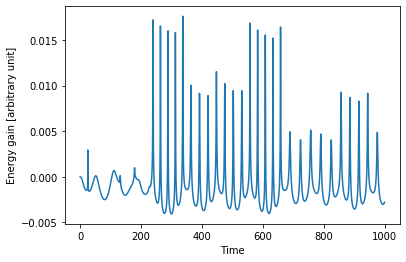

In [0]:
plt.plot(T1,E1);
plt.xlabel("Time");
plt.ylabel("Energy gain [arbitrary unit]");
plt.show()

**Quad tree efficiency**

The actual efficiency of the quad tree algorithm can be seen here. For small number of particles (like the once in the simulations above), it makes a very small difference using the quad tree instead of the naive double for-loop for calculating the accelleration. Since there is significant overhead in building the quadtree, this probably does not start to pay off until around 10^3 particles is reached, at which point python/jupyter is way too slow to run the simulation in real time either way. However, for large number of particles (> 10^4), the benefit is probably quite substantial.

Frame: 0 interactions: 88

Frame: 0 interactions: 802

Frame: 0 interactions: 6774

Frame: 0 interactions: 47681

Frame: 0 interactions: 277553

Frame: 0 interactions: 5271571



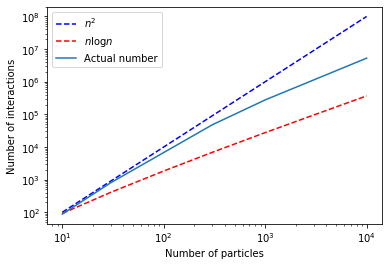

In [0]:
Body.theta = 20*np.pi/180;
n = np.array([10,30,100,300, 1000, 10000]);
inter = [];
for i in n:
  T1,E1,I1 = run_system(i, 1, plot=False);
  inter.append(I1[0]);

plt.figure();
plt.loglog(n, np.power(n, 2), 'b--', label=r"$n^2$");
plt.loglog(n, np.log(n)*n*4, 'r--', label=r"$n\log n$");
plt.loglog(n, inter, label="Actual number")
plt.xlabel("Number of particles");
plt.ylabel("Number of interactions");
plt.legend();
plt.show();


# **Discussion**

Simulating the motion of particles under the force of gravity was actually how I first really got into programming some 10 years ago, so this problem lies close to my heart. 

While this is certainly something that can be done, a (poorly optimized) python script running in a web-browser is not the optimal setup from a performance standpoint, and so the simulations here run painfully slow. We have however shown the potential in using a quadtree/octtree structure to reduce the number of required interactions, and with 10^4 particles we only required about 1/20th the number of calculations as compared to a direct brute force approach.

We have also shown that the Verlet-Størmer method is suitable for a task as this, since it is energy conserving, but is almost equal in computational cost to the common forward Euler method. While the method used in the first task of this lab (the theta/trapezoidal method) is also suitable from an energy-conserving standpoint, since it uses an itertive method to solve for the updated parameters, that would require recalculating the net accelleration in every iteration, it would result in very poor performance.